In [1]:
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import dlisio
import pandas as pd
import numpy as np
import scipy.signal as signal
import logging
import copy

# Ensure that we can see pandas tables of up to 500 rows
pd.set_option('display.max_rows', 500)

# Set a default DPI for all figures in this file. Lower DPI gives smaller figures, higher bigger.
mpl.rcParams['figure.dpi'] = 100

In [2]:
dlisio.set_encodings(['latin1'])

In [3]:
filename = 'MESTB _009_1B.dlis'

f, *f_tail = dlisio.load(filename)

if len(f_tail): logging.warning('There are more logical files in tail')

In [4]:
origin, *origin_tail = f.origins

if len(origin_tail): logging.warning('f contains multiple origins')

In [5]:
f.describe()

------------
Logical File
------------
Description : dlis(MESTB .009)
Frames      : 1
Channels    : 65

Known objects
--
TOOL        : 1
FRAME       : 1
FILE-HEADER : 1
ORIGIN      : 2
CHANNEL     : 65
PARAMETER   : 423


In [6]:
origin, *origin_tail = f.origins
print(len(origin_tail))

1


In [7]:
origin.describe()

------
Origin
------
name   : WELL-ODP Leg 194, Site 1196A
origin : 115
copy   : 0

Logical file ID          : MESTB .009
File set name and number : MESTB / 1
File number and type     : 0 / CUSTOMER

Well (id/name)          :  / ODP Leg 194, Site 1196A
Produced by (code/name) : 440 / Schlumberger
Produced for            : Lamont Doherty
Created                 : 2021-09-20 12:54:27

Created by              : Techlog, (version: 2017.2 (rev: 234070))
Other programs/services : WELL-ODP Leg 194, Site 1196A


In [8]:
def summarize(objs, **kwargs):
    """Create a pd.DataFrame that summarize the content of 'objs', One 
    object pr. row
    
    Parameters
    ----------
    
    objs : list()
        list of metadata objects
        
    **kwargs
        Keyword arguments 
        Use kwargs to tell summarize() which fields (attributes) of the 
        objects you want to include in the DataFrame. The parameter name 
        must match an attribute on the object in 'objs', while the value 
        of the parameters is used as a column name. Any kwargs are excepted, 
        but if the object does not have the requested attribute, 'KeyError' 
        is used as the value.
        
    Returns
    -------
    
    summary : pd.DataFrame
    """
    summary = []
    for attr, label in kwargs.items():
        column = []
        for obj in objs:
            try:
                value = getattr(obj, attr)
            except AttributeError:
                value = 'KeyError'
    
            column.append(value)
        summary.append(column)

    summary = pd.DataFrame(summary).T
    summary.columns = kwargs.values()
    return summary

In [9]:
for frame in f.frames:
    
    # Search through the channels for the index and obtain the units
    for channel in frame.channels:
        if channel.name == frame.index:
            depth_units = channel.units
    
    print(f'Frame Name: \t\t {frame.name}')
    print(f'Index Type: \t\t {frame.index_type}')
    print(f'Depth Interval: \t {frame.index_min} - {frame.index_max} {depth_units}')
    print(f'Depth Spacing: \t\t {frame.spacing} {depth_units}')
    print(f'Direction: \t\t {frame.direction}')
    print(f'Num of Channels: \t {len(frame.channels)}')
    print(f'Channel Names: \t\t {str(frame.channels)}')
    print('\n\n')

Frame Name: 		 1B
Index Type: 		 BOREHOLE-DEPTH
Depth Interval: 	 149101.0 - 322140.0 0.1 in
Depth Spacing: 		 -1.0 0.1 in
Direction: 		 DECREASING
Num of Channels: 	 65
Channel Names: 		 [Channel(TDEP), Channel(BA11), Channel(BA12), Channel(BA13), Channel(BA14), Channel(BA15), Channel(BA16), Channel(BA17), Channel(BA18), Channel(BA21), Channel(BA22), Channel(BA23), Channel(BA24), Channel(BA25), Channel(BA26), Channel(BA27), Channel(BA28), Channel(BB11), Channel(BB12), Channel(BB13), Channel(BB14), Channel(BB15), Channel(BB16), Channel(BB17), Channel(BB18), Channel(BB21), Channel(BB22), Channel(BB23), Channel(BB24), Channel(BB25), Channel(BB26), Channel(BB27), Channel(BB28), Channel(BC11), Channel(BC12), Channel(BC13), Channel(BC14), Channel(BC15), Channel(BC16), Channel(BC17), Channel(BC18), Channel(BC21), Channel(BC22), Channel(BC23), Channel(BC24), Channel(BC25), Channel(BC26), Channel(BC27), Channel(BC28), Channel(BD11), Channel(BD12), Channel(BD13), Channel(BD14), Channel(BD15), C

In [10]:
def summary_dataframe(object, **kwargs):
    # Create an empty dataframe
    df = pd.DataFrame()
    
    # Iterate over each of the keyword arguments
    for i, (key, value) in enumerate(kwargs.items()):
        list_of_values = []
        
        # Iterate over each parameter and get the relevant key
        for item in object:
            # Account for any missing values.
            try:
                x = getattr(item, key)
                list_of_values.append(x)
            except:
                list_of_values.append('')
                continue
        
        # Add a new column to our data frame
        df[value]=list_of_values
    
    # Sort the dataframe by column 1 and return it
    return df.sort_values(df.columns[0])


In [11]:
param_df = summary_dataframe(f.parameters, name='Name', long_name='Long Name', values='Value')

# Hiding people's names that may be in parameters.
# These two lines can be commented out to show them
mask = param_df['Name'].isin(['R8', 'RR1', 'WITN', 'ENGI'])
param_df = param_df[~mask]

param_df

,Name,Long Name,Value
415,ACCC,Accelerometer coefficients,[-0.0004;0;0.0011;-0.0003;2e-06;-7.6e-05;1e-06...
416,ACCM,Accelerometer Month of Calibration,[10]
405,ACCN,Accelerometer Serial Number,[448]
419,ACCT,Accelerometer Type (Manufacturer Code),[3]
406,ACCY,Accelerometer Year of Calibration,[92]
409,ACPP,Accelerometer PROM Presence,[PRESENT]
372,ACQUISITION-PRODUCT,,[OP]
414,AFMO,Accelerometer Filtering Mode,[MAVE]
26,ALTDPCHAN,Name of alternate depth channel,[SPEEDCORRECTEDDEPTH]
196,ALTDPCHAN,Name of alternate depth channel,[SPEEDCORRECTEDDEPTH]


In [12]:
channels = summary_dataframe(f.channels, name='Name', long_name='Long Name', dimension='Dimension', units='Units', frame='Frame')
channels

,Name,Long Name,Dimension,Units,Frame
1,BA11,CALIBRATED DATA BUTTON A11,[1],,Frame(1B)
2,BA12,CALIBRATED DATA BUTTON A12,[1],,Frame(1B)
3,BA13,CALIBRATED DATA BUTTON A13,[1],,Frame(1B)
4,BA14,CALIBRATED DATA BUTTON A14,[1],,Frame(1B)
5,BA15,CALIBRATED DATA BUTTON A15,[1],,Frame(1B)
6,BA16,CALIBRATED DATA BUTTON A16,[1],,Frame(1B)
7,BA17,CALIBRATED DATA BUTTON A17,[1],,Frame(1B)
8,BA18,CALIBRATED DATA BUTTON A18,[1],,Frame(1B)
9,BA21,CALIBRATED DATA BUTTON A21,[1],,Frame(1B)
10,BA22,CALIBRATED DATA BUTTON A22,[1],,Frame(1B)


In [13]:
frame1 =f.object('FRAME','1B') 

In [14]:
curves = frame1.curves()

In [15]:
df = pd.DataFrame(frame.curves())
df

,FRAMENO,TDEP,BA11,BA12,BA13,BA14,BA15,BA16,BA17,BA18,...,BD17,BD18,BD21,BD22,BD23,BD24,BD25,BD26,BD27,BD28
0,1,322140.0,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
1,2,322139.0,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
2,3,322138.0,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
3,4,322137.0,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
4,5,322136.0,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173035,173036,149105.0,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301
173036,173037,149104.0,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301
173037,173038,149103.0,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301
173038,173039,149102.0,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301


In [16]:
df["TDEP"]=(df["TDEP"])* 0.00254

In [17]:
df.index = df["TDEP"]
df

,FRAMENO,TDEP,BA11,BA12,BA13,BA14,BA15,BA16,BA17,BA18,...,BD17,BD18,BD21,BD22,BD23,BD24,BD25,BD26,BD27,BD28
TDEP,,,,,,,,,,,,,,,,,,,,,
818.23560,1,818.23560,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
818.23306,2,818.23306,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
818.23052,3,818.23052,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
818.22798,4,818.22798,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
818.22544,5,818.22544,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,...,0.092773,0.185547,-0.043945,-0.014648,0.039062,-0.024414,0.068359,0.092773,0.180664,0.141602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,173036,378.72670,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301
378.72416,173037,378.72416,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301
378.72162,173038,378.72162,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,...,7.338867,7.587891,9.741211,8.754883,8.007812,7.519531,7.377930,7.426758,7.705078,7.258301


In [18]:
df.columns

Index(['FRAMENO', 'TDEP', 'BA11', 'BA12', 'BA13', 'BA14', 'BA15', 'BA16',
       'BA17', 'BA18', 'BA21', 'BA22', 'BA23', 'BA24', 'BA25', 'BA26', 'BA27',
       'BA28', 'BB11', 'BB12', 'BB13', 'BB14', 'BB15', 'BB16', 'BB17', 'BB18',
       'BB21', 'BB22', 'BB23', 'BB24', 'BB25', 'BB26', 'BB27', 'BB28', 'BC11',
       'BC12', 'BC13', 'BC14', 'BC15', 'BC16', 'BC17', 'BC18', 'BC21', 'BC22',
       'BC23', 'BC24', 'BC25', 'BC26', 'BC27', 'BC28', 'BD11', 'BD12', 'BD13',
       'BD14', 'BD15', 'BD16', 'BD17', 'BD18', 'BD21', 'BD22', 'BD23', 'BD24',
       'BD25', 'BD26', 'BD27', 'BD28'],
      dtype='object')

In [19]:
fmsdf = df[['BA11', 'BA12', 'BA13', 'BA14', 'BA15', 
               'BA16', 'BA17', 'BA18', 'BA21','BA22', 
               'BA23', 'BA24', 'BA25', 'BA26', 'BA27', 
               'BA28', 'BB11', 'BB12', 'BB13', 'BB14', 'BB15', 'BB16', 'BB17',
               'BB18', 'BB21', 'BB22', 'BB23', 'BB24', 'BB25', 'BB26', 'BB27', 'BB28',
               'BC11', 'BC12', 'BC13', 'BC14', 'BC15', 'BC16', 'BC17', 'BC18', 'BC21',
               'BC22', 'BC23', 'BC24', 'BC25', 'BC26', 'BC27', 'BC28', 'BD11', 'BD12',
               'BD13', 'BD14', 'BD15', 'BD16', 'BD17', 'BD18', 'BD21', 'BD22', 'BD23',
               'BD24', 'BD25', 'BD26', 'BD27', 'BD28']]

In [20]:
fms1df = df[['BA11', 'BA12', 'BA13', 'BA14', 'BA15', 'BA16', 'BA17', 'BA18', 
             'BA21','BA22', 'BA23', 'BA24', 'BA25', 'BA26', 'BA27', 'BA28']]
fms1df

,BA11,BA12,BA13,BA14,BA15,BA16,BA17,BA18,BA21,BA22,BA23,BA24,BA25,BA26,BA27,BA28
TDEP,,,,,,,,,,,,,,,,
818.23560,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,-0.136719,-0.078125,-0.136719,-0.136719,-0.195312,-0.122070,-0.175781,-0.141602
818.23306,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,-0.136719,-0.078125,-0.136719,-0.136719,-0.195312,-0.122070,-0.175781,-0.141602
818.23052,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,-0.136719,-0.078125,-0.136719,-0.136719,-0.195312,-0.122070,-0.175781,-0.141602
818.22798,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,-0.136719,-0.078125,-0.136719,-0.136719,-0.195312,-0.122070,-0.175781,-0.141602
818.22544,-0.131836,-0.136719,-0.039062,-0.161133,-0.180664,-0.141602,-0.117188,-0.112305,-0.136719,-0.078125,-0.136719,-0.136719,-0.195312,-0.122070,-0.175781,-0.141602
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,21.762695,18.359375,15.278320,14.262695,13.364258,13.364258,14.731445,16.208496
378.72416,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,21.762695,18.359375,15.278320,14.262695,13.364258,13.364258,14.731445,16.208496
378.72162,27.504883,20.004883,16.250000,14.223633,13.520508,13.090820,13.786621,14.965820,21.762695,18.359375,15.278320,14.262695,13.364258,13.364258,14.731445,16.208496


In [21]:
fms1dfNorm=((fms1df-fms1df.min())/(fms1df.max()-fms1df.min()))*255

In [22]:
fms1dfNorm

,BA11,BA12,BA13,BA14,BA15,BA16,BA17,BA18,BA21,BA22,BA23,BA24,BA25,BA26,BA27,BA28
TDEP,,,,,,,,,,,,,,,,
818.23560,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,0.660184,1.413499,1.188774,1.500850,0.964448,1.069031
818.23306,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,0.660184,1.413499,1.188774,1.500850,0.964448,1.069031
818.23052,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,0.660184,1.413499,1.188774,1.500850,0.964448,1.069031
818.22798,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,0.660184,1.413499,1.188774,1.500850,0.964448,1.069031
818.22544,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,0.660184,1.413499,1.188774,1.500850,0.964448,1.069031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,92.607338,67.273941,56.855133,50.425682,47.665245,45.110920,47.013062,51.911285,74.328201,61.805016,51.494331,48.781773,45.799919,45.836113,50.038765,54.898346
378.72416,92.607338,67.273941,56.855133,50.425682,47.665245,45.110920,47.013062,51.911285,74.328201,61.805016,51.494331,48.781773,45.799919,45.836113,50.038765,54.898346
378.72162,92.607338,67.273941,56.855133,50.425682,47.665245,45.110920,47.013062,51.911285,74.328201,61.805016,51.494331,48.781773,45.799919,45.836113,50.038765,54.898346


In [23]:
fms2df = df[['BB11', 'BB12', 'BB13', 'BB14', 'BB15', 'BB16', 'BB17', 'BB18', 
             'BB21','BB22', 'BB23', 'BB24', 'BB25', 'BB26', 'BB27', 'BB28']]

In [24]:
fms2dfNorm=((fms2df-fms2df.min())/(fms2df.max()-fms2df.min()))*255
fms2dfNorm

,BB11,BB12,BB13,BB14,BB15,BB16,BB17,BB18,BB21,BB22,BB23,BB24,BB25,BB26,BB27,BB28
TDEP,,,,,,,,,,,,,,,,
818.23560,3.362011,2.065498,2.020916,2.596154,3.323460,2.645597,1.969714,2.42717,2.704762,2.505277,2.074528,2.884921,2.578579,1.736969,1.499526,1.381287
818.23306,3.362011,2.065498,2.020916,2.596154,3.323460,2.645597,1.969714,2.42717,2.704762,2.505277,2.074528,2.884921,2.578579,1.736969,1.499526,1.381287
818.23052,3.362011,2.065498,2.020916,2.596154,3.323460,2.645597,1.969714,2.42717,2.704762,2.505277,2.074528,2.884921,2.578579,1.736969,1.499526,1.381287
818.22798,3.362011,2.065498,2.020916,2.596154,3.323460,2.645597,1.969714,2.42717,2.704762,2.505277,2.074528,2.884921,2.578579,1.736969,1.499526,1.381287
818.22544,3.362011,2.065498,2.020916,2.596154,3.323460,2.645597,1.969714,2.42717,2.704762,2.505277,2.074528,2.884921,2.578579,1.736969,1.499526,1.381287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,45.830807,47.895630,52.522980,56.017014,61.274837,64.705978,66.248711,71.68734,46.366077,50.222973,53.767242,58.295696,58.694912,56.901978,60.746918,82.716591
378.72416,45.830807,47.895630,52.522980,56.017014,61.274837,64.705978,66.248711,71.68734,46.366077,50.222973,53.767242,58.295696,58.694912,56.901978,60.746918,82.716591
378.72162,45.830807,47.895630,52.522980,56.017014,61.274837,64.705978,66.248711,71.68734,46.366077,50.222973,53.767242,58.295696,58.694912,56.901978,60.746918,82.716591


In [25]:
fms3df = df[['BC11', 'BC12', 'BC13', 'BC14', 'BC15', 'BC16', 'BC17', 'BC18', 
             'BC21','BC22', 'BC23', 'BC24', 'BC25', 'BC26', 'BC27', 'BC28']]

In [26]:
fms3dfNorm=((fms3df-fms3df.min())/(fms3df.max()-fms3df.min()))*255
fms3dfNorm

,BC11,BC12,BC13,BC14,BC15,BC16,BC17,BC18,BC21,BC22,BC23,BC24,BC25,BC26,BC27,BC28
TDEP,,,,,,,,,,,,,,,,
818.23560,3.125615,3.027805,3.717468,4.392993,4.423489,3.298679,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.23306,3.125615,3.027805,3.717468,4.392993,4.423489,3.298679,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.23052,3.125615,3.027805,3.717468,4.392993,4.423489,3.298679,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.22798,3.125615,3.027805,3.717468,4.392993,4.423489,3.298679,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.22544,3.125615,3.027805,3.717468,4.392993,4.423489,3.298679,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,29.915466,28.469393,28.376486,29.813278,31.117052,30.698442,31.951517,35.893600,28.188328,28.075769,29.850119,31.168377,32.366547,31.821009,36.488880,52.977077
378.72416,29.915466,28.469393,28.376486,29.813278,31.117052,30.698442,31.951517,35.893600,28.188328,28.075769,29.850119,31.168377,32.366547,31.821009,36.488880,52.977077
378.72162,29.915466,28.469393,28.376486,29.813278,31.117052,30.698442,31.951517,35.893600,28.188328,28.075769,29.850119,31.168377,32.366547,31.821009,36.488880,52.977077


In [27]:
fms4df = df[['BD11', 'BD12', 'BD13', 'BD14', 'BD15', 'BD16', 'BD17', 'BD18', 
             'BD21','BD22', 'BD23', 'BD24', 'BD25', 'BD26', 'BD27', 'BD28']]

In [28]:
fms4dfNorm=((fms4df-fms4df.min())/(fms4df.max()-fms4df.min()))*255
fms4dfNorm

,BD11,BD12,BD13,BD14,BD15,BD16,BD17,BD18,BD21,BD22,BD23,BD24,BD25,BD26,BD27,BD28
TDEP,,,,,,,,,,,,,,,,
818.23560,1.410172,1.269435,1.753628,1.991426,2.610009,2.198192,1.706443,2.510809,1.242486,1.138732,2.520887,1.928467,1.891050,2.649299,3.092054,7.943570
818.23306,1.410172,1.269435,1.753628,1.991426,2.610009,2.198192,1.706443,2.510809,1.242486,1.138732,2.520887,1.928467,1.891050,2.649299,3.092054,7.943570
818.23052,1.410172,1.269435,1.753628,1.991426,2.610009,2.198192,1.706443,2.510809,1.242486,1.138732,2.520887,1.928467,1.891050,2.649299,3.092054,7.943570
818.22798,1.410172,1.269435,1.753628,1.991426,2.610009,2.198192,1.706443,2.510809,1.242486,1.138732,2.520887,1.928467,1.891050,2.649299,3.092054,7.943570
818.22544,1.410172,1.269435,1.753628,1.991426,2.610009,2.198192,1.706443,2.510809,1.242486,1.138732,2.520887,1.928467,1.891050,2.649299,3.092054,7.943570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,37.361538,34.083469,36.397984,34.914902,33.138554,30.307816,27.546862,26.910721,33.579384,35.224770,38.928745,36.981182,34.244213,31.980368,29.563475,30.858471
378.72416,37.361538,34.083469,36.397984,34.914902,33.138554,30.307816,27.546862,26.910721,33.579384,35.224770,38.928745,36.981182,34.244213,31.980368,29.563475,30.858471
378.72162,37.361538,34.083469,36.397984,34.914902,33.138554,30.307816,27.546862,26.910721,33.579384,35.224770,38.928745,36.981182,34.244213,31.980368,29.563475,30.858471


In [29]:
fms123df = pd.concat([fms1dfNorm, fms2dfNorm, fms3dfNorm], axis=1, join="inner")

In [30]:
fms123df

,BA11,BA12,BA13,BA14,BA15,BA16,BA17,BA18,BA21,BA22,...,BC17,BC18,BC21,BC22,BC23,BC24,BC25,BC26,BC27,BC28
TDEP,,,,,,,,,,,,,,,,,,,,,
818.23560,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,...,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.23306,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,...,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.23052,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,...,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.22798,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,...,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
818.22544,1.917413,0.784441,3.472436,2.313603,1.486626,1.434395,1.198656,2.542006,2.688807,1.045906,...,3.092862,2.673699,3.033480,2.751192,3.048043,3.379519,4.059012,3.607037,5.591616,21.813217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378.72670,92.607338,67.273941,56.855133,50.425682,47.665245,45.110920,47.013062,51.911285,74.328201,61.805016,...,31.951517,35.893600,28.188328,28.075769,29.850119,31.168377,32.366547,31.821009,36.488880,52.977077
378.72416,92.607338,67.273941,56.855133,50.425682,47.665245,45.110920,47.013062,51.911285,74.328201,61.805016,...,31.951517,35.893600,28.188328,28.075769,29.850119,31.168377,32.366547,31.821009,36.488880,52.977077
378.72162,92.607338,67.273941,56.855133,50.425682,47.665245,45.110920,47.013062,51.911285,74.328201,61.805016,...,31.951517,35.893600,28.188328,28.075769,29.850119,31.168377,32.366547,31.821009,36.488880,52.977077


In [31]:
import numpy as np
finalfms123df_array = fms123df[["BA11","BB11","BC11","BA12","BB12","BC12","BA13","BB13","BC13","BA14","BB14","BC14","BA15","BB15","BC15","BA16","BB16","BC16","BA17","BB17","BC17","BA18","BB18","BC18","BA21","BB21","BC21","BA22","BB22","BC22","BA23","BB23","BC23","BA24","BB24","BC24","BA25","BB25","BC25","BA26","BB26","BC26","BA27","BB27","BC27","BA28","BB28","BC28"]].values.reshape(173040,16,3).astype(np.uint8)   
finalfms123df_array

array([[[ 1,  3,  3],
        [ 0,  2,  3],
        [ 3,  2,  3],
        ...,
        [ 1,  1,  3],
        [ 0,  1,  5],
        [ 1,  1, 21]],

       [[ 1,  3,  3],
        [ 0,  2,  3],
        [ 3,  2,  3],
        ...,
        [ 1,  1,  3],
        [ 0,  1,  5],
        [ 1,  1, 21]],

       [[ 1,  3,  3],
        [ 0,  2,  3],
        [ 3,  2,  3],
        ...,
        [ 1,  1,  3],
        [ 0,  1,  5],
        [ 1,  1, 21]],

       ...,

       [[92, 45, 29],
        [67, 47, 28],
        [56, 52, 28],
        ...,
        [45, 56, 31],
        [50, 60, 36],
        [54, 82, 52]],

       [[92, 45, 29],
        [67, 47, 28],
        [56, 52, 28],
        ...,
        [45, 56, 31],
        [50, 60, 36],
        [54, 82, 52]],

       [[92, 45, 29],
        [67, 47, 28],
        [56, 52, 28],
        ...,
        [45, 56, 31],
        [50, 60, 36],
        [54, 82, 52]]], dtype=uint8)

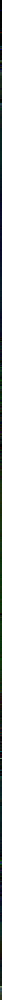

In [32]:
import numpy as np
from PIL import Image
img = Image.fromarray(finalfms123df_array)
img_lanczos= img.resize((256, 87904), resample=Image.LANCZOS)
img_lanczos
#Calculate the output pixel value using a high-quality Lanczos filter 
#(a truncated sinc) on all pixels that may contribute to the output value. 

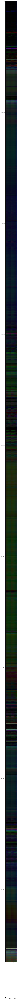

In [33]:
plt.figure(figsize=(2,200))
plt.imshow(finalfms123df_array, interpolation='none',
           aspect='auto', cmap=plt.cm.YlOrBr)

plt.colorbar(orientation='horizontal', pad =0.03)

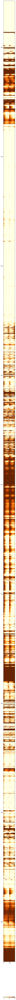

In [34]:
plt.figure(figsize=(2,200))
miny = fms1df.index.min()
maxy = fms1df.index.max()
plt.imshow(fms1df, interpolation='none',
           aspect='auto', cmap=plt.cm.YlOrBr,
           vmin=4.0, vmax=8.0,
          extent=[0, 360, maxy, miny])

plt.ylim(818.23560, 378.71654)

plt.colorbar(orientation='horizontal', pad =0.03)